# Introduction

In this work, using integral field spectroscopy data, we will calculate the rotation curves of a galaxy and compare them with the theoretical ones. This will allow us to observe the effect that dark matter has on the galaxy's rotation, serving as evidence of its existence. Before that, we will analyze how the redshift varies across the galaxy by integrating over different intervals around the H$\alpha$ line, and we will visualize this variation with a GIF.

# Libraries

In [1]:
import glob
import numpy as np
import matplotlib.pyplot as plt
from astropy.wcs import WCS
from astropy.io import fits
from astropy.coordinates import SkyCoord
import astropy.units as u
from photutils.detection import DAOStarFinder
from astropy.stats import sigma_clipped_stats, SigmaClip
from photutils.aperture import CircularAperture, aperture_photometry
import imageio.v3 as iio
import os
from natsort import natsorted
import imageio.v2 as imageio
from astropy.modeling import models, fitting
from astropy.modeling.models import Polynomial1D

# Data and Conversion Factors

Before starting to generate the H$\alpha$ images, it is advisable to extract from the data cube all the information we will need, as well as the necessary conversion factors.

In [24]:
def imstats(data):
    """
    Calcula parámetros estadísticos como el total, máximo, mínimo, media, mediana y desviación de un conjunto de datos ignorando los valores NaNs.

    Parámetros
    ----------
    data : numpy.ndarray
        Array de un conjunto de datos.

    Retorna
    -------
    dict
        Un diccionario con las siguientes estadísticas:
        - 'total': número total de elementos en la matriz de datos.
        - 'minimum': valor mínimo ignorando los valores NaNs.
        - 'maximum': valor máximo ignorando los valores NaNs.
        - 'average': media ignorando los valores NaNs.
        - 'median': mediana ignorando los valores NaNs.
        - 'desviation': desviación estándar ignorando los valores NaNs.
    """
    x, y = np.shape(data)[0], np.shape(data)[1]
    stad = x * y, float(np.nanmin(data)), float(np.nanmax(data)), float(np.nanmean(data)), float(np.nanmedian(data)), float(np.nanstd(data))
    dicti = {'total':stad[0], 'minimum':stad[1], 'maximum':stad[2], 
             'average':stad[3], 'median':stad[4], 'desviation':stad[5]}
    return dicti

In [2]:
cube = fits.open('ESO113-G032.fits')

In [3]:
ndim = cube[1].header['NAXIS']              #Dimension number
x_axislength = cube[1].header['NAXIS1']     #Axis-x length
y_axislength = cube[1].header['NAXIS2']     #Axis-y length
z_axislength = cube[1].header['NAXIS3']     #Axis-z length
pixelscale_x = cube[1].header['CD1_1']      #Ra scale
pixelscale_y = cube[1].header['CD2_2']      #Dec scale
lambda_scale = cube[1].header['CD3_3']      #wavelength scale
CRPIX1 = cube[1].header['CRPIX1']
CRVAL1 = cube[1].header['CRVAL1']
CRPIX2 = cube[1].header['CRPIX2']
CRVAL2 = cube[1].header['CRVAL2']
CRPIX3 = cube[1].header['CRPIX3']
CRVAL3 = cube[1].header['CRVAL3']

Emplearemos de redshift de la galaxia el obtenido en el trabajo anterior para el centro de la galaxia.

In [4]:
redshift = 0.028947371544128853

In [5]:
#Galaxy angles
theta = np.deg2rad(56)
incl = np.deg2rad(71)

In [6]:
#Galaxy distance
c = 3e5  # km/s
H0 = 70  # km/s/Mpc
D = ((c * redshift) / H0) * 10**6

124060163.76055224

In [7]:
data = cube[1].data

In [8]:
Lambda = [lambda_scale * (i - CRPIX3) + CRVAL3 for i in range(z_axislength)]      

In [106]:
#What one pixel corresponds to in arcseconds
pix_arcsec = abs(pixelscale_x) * 3600

0.20000000000000015

In [105]:
#What one arcsec corresponds to in arcseconds
pix_pc = (np.pi * D * pix_arcsec) / (3600 * 180)

In [11]:
Lambda_Ha = 6563
Lambda_obs = Lambda_Ha * (1 + redshift)

6752.981599444118

In [12]:
Lambda_NII = 6583
Lambda_obs_NII = Lambda_NII * (1 + redshift)

6773.560546875

# H$\alpha$ images

To create the different images, we define three bands: one centered around the H$\alpha$ line corrected with the redshift of the galaxy's center, and two additional bands located on either side of it. The central band is divided into small sub-bands, which serve as integration intervals. For each of these, the continuum spectrum is removed by subtracting the average flux from the two adjacent bands.

Using a central band or window of 200 Å gives us a first approximation, which is then refined using windows of different sizes and integration intervals. Here, to simplify the code, a loop was implemented that first uses the 200 Å window and then refines the process with an 80 Å window, and finally with a 24 Å window. These last two use integration intervals of 2 Å.

What we should observe are HII regions within a part of the galaxy. Since the loop is designed to integrate from shorter to longer wavelengths, we should first see the region with the lowest redshift and end with the region with the highest redshift. As we observed in the previous analysis, the upper part of the disk has the lowest redshift, while the lower part has the highest. The sides of the disk retain the galaxy's central redshift. Therefore, we should first see the upper part of the galaxy, then the central regions on both sides of the disk, and finally the lower part. As previously discussed, this difference is due to the rotation of the disk.

In [27]:
band_width = [200, 80, 24]  #window around H-alpha
bandHa_widths = [20, 2, 2]  #Integration intervals
band_inter_width = 100      #side bands


for index_band_width, index_bandHa_widths in zip(band_width, bandHa_widths):
    # Integration intervals 
    band_left2 = Lambda_obs - (index_band_width / 2)
    band_left1 = band_left2 - band_inter_width
    band_right2 = Lambda_obs + (index_band_width / 2)
    band_right1 = band_right2 + band_inter_width

    pixel_band_left2 = int((band_left2 - CRVAL3) / lambda_scale + CRPIX3)
    pixel_band_left1 = int((band_left1 - CRVAL3) / lambda_scale + CRPIX3)
    pixel_band_right2 = int((band_right2 - CRVAL3) / lambda_scale + CRPIX3)
    pixel_band_right1 = int((band_right1 - CRVAL3) / lambda_scale + CRPIX3)
    
    band_left_data = data[pixel_band_left1:pixel_band_left2, :, :]
    band_right_data = data[pixel_band_right1:pixel_band_right2, :, :]
    flux_band_left = np.sum(band_left_data, axis=0)
    flux_band_right = np.sum(band_right_data, axis=0)
    factor = band_inter_width / index_bandHa_widths
    band_median = ((flux_band_left + flux_band_right) / 2) / factor
    
    # We prepare while
    bandHa_right = band_left2
    iterat = index_band_width / index_bandHa_widths
    index_iterat = 1
    while index_iterat <= iterat:
        # Band H-alpha 
        bandHa_left = bandHa_right
        bandHa_right = bandHa_left + index_bandHa_widths
        pixel_bandHa_left = int((bandHa_left - CRVAL3) / lambda_scale + CRPIX3)
        pixel_bandHa_right = int((bandHa_right - CRVAL3) / lambda_scale + CRPIX3)
        band_Ha_data = data[pixel_bandHa_left:pixel_bandHa_right, :, :]
        flux_band_Ha = np.sum(band_Ha_data, axis=0)
        # free continium
        free_continium = flux_band_Ha - band_median
        # save
        hdu_galaxyHa_bands = fits.PrimaryHDU(free_continium.astype(np.float32))
        hdu_galaxyHa_bands.writeto(f'galaxy_HIIregions{index_band_width}{index_iterat}.fits', overwrite=True)
        index_iterat = index_iterat + 1


In [28]:
fileList_galaxy200 = natsorted(glob.glob('galaxy_HIIregions200*fits'))
fileList_galaxy80 = natsorted(glob.glob('galaxy_HIIregions80*fits'))
fileList_galaxy24 = natsorted(glob.glob('galaxy_HIIregions24*fits'))

In [29]:
galaxy_concat_bands200 = [
    fits.open(galaxy_bands_item)[0].data 
    for galaxy_bands_item in fileList_galaxy200   
]

In [30]:
galaxy_concat_bands80 = [
    fits.open(galaxy_bands_item)[0].data 
    for galaxy_bands_item in fileList_galaxy80   
]

In [31]:
galaxy_concat_bands24 = [
    fits.open(galaxy_bands_item)[0].data 
    for galaxy_bands_item in fileList_galaxy24   
]

First, we will view the images of the 200 Å window. The 80 Å images will not be shown, as they were only used for fine-tuning.

galaxy_HIIregions2001.fits


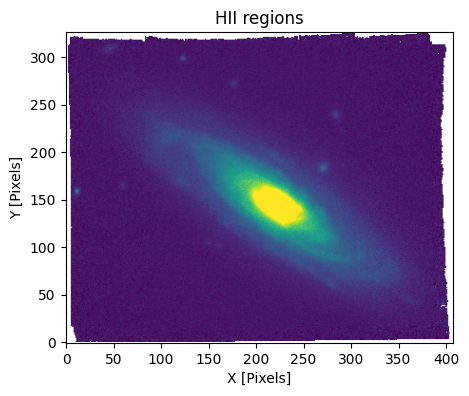

galaxy_HIIregions2002.fits


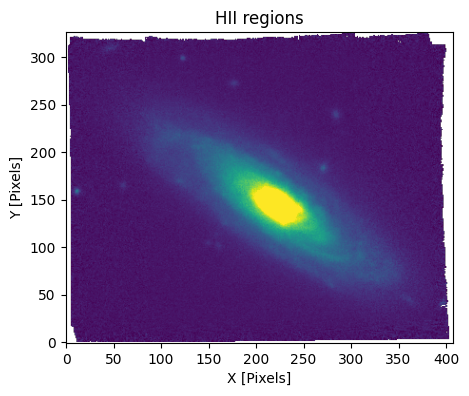

galaxy_HIIregions2003.fits


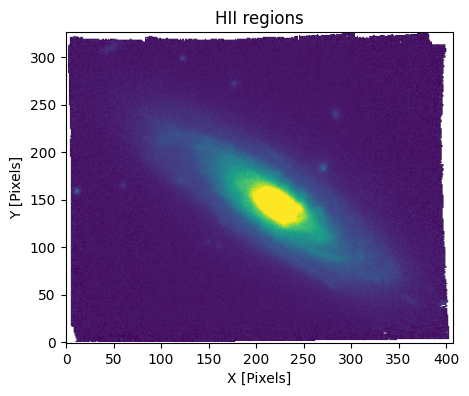

galaxy_HIIregions2004.fits


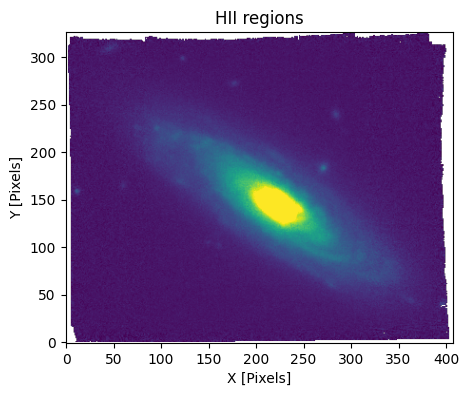

galaxy_HIIregions2005.fits


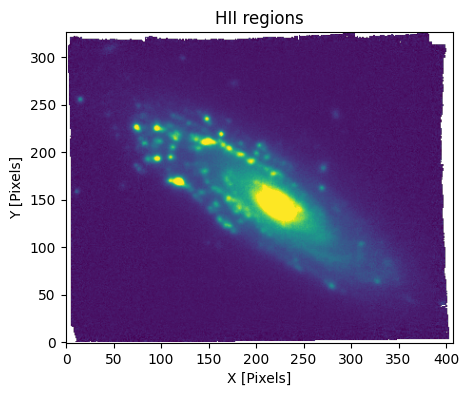

galaxy_HIIregions2006.fits


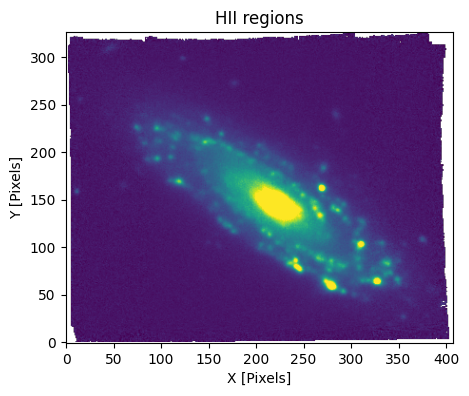

galaxy_HIIregions2007.fits


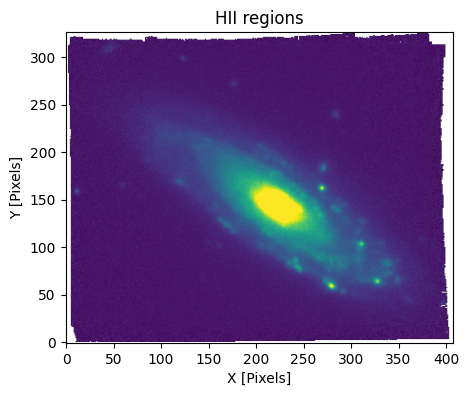

galaxy_HIIregions2008.fits


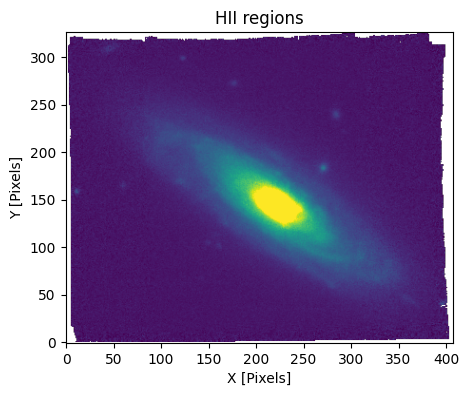

galaxy_HIIregions2009.fits


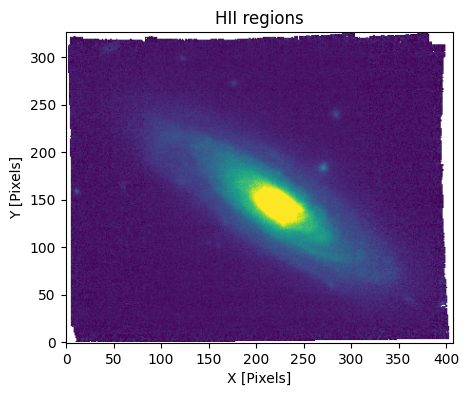

galaxy_HIIregions20010.fits


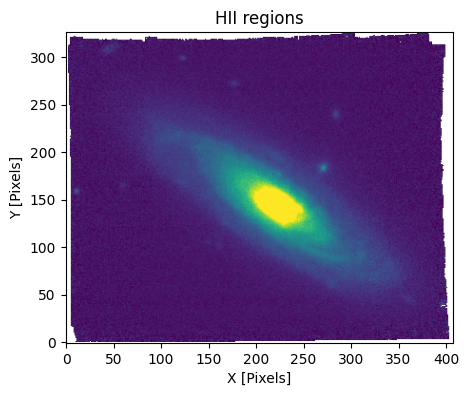

In [45]:
for index_galaxy_concat, filename in zip(galaxy_concat_bands200, fileList_galaxy200):
    print(filename)
    plt.figure("line Ha", figsize=(5,5))
    plt.imshow(
    index_galaxy_concat,  
    vmin=imstats(index_galaxy_concat)['median'] - 0.3 * imstats(index_galaxy_concat)['desviation'], 
    vmax=imstats(index_galaxy_concat)['median'] + 4.0 * imstats(index_galaxy_concat)['desviation'],
    origin="lower")
    plt.title('HII regions')
    plt.xlabel('X [Pixels]')
    plt.ylabel('Y [Pixels]')
    plt.show()

Now we will see the final images with which we will create the gif. As you can see, there is still some of the continuous spectrum, but you can still observe the HII regions.

galaxy_HIIregions241.fits


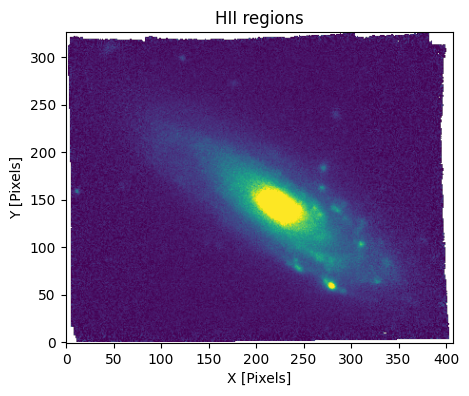

galaxy_HIIregions242.fits


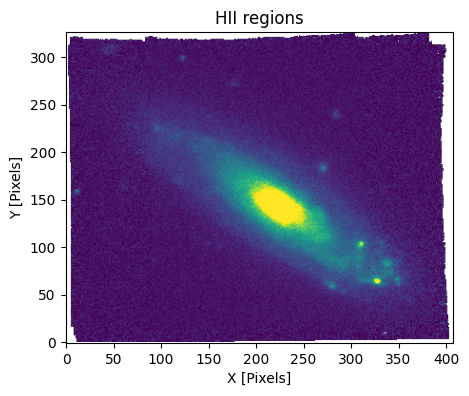

galaxy_HIIregions243.fits


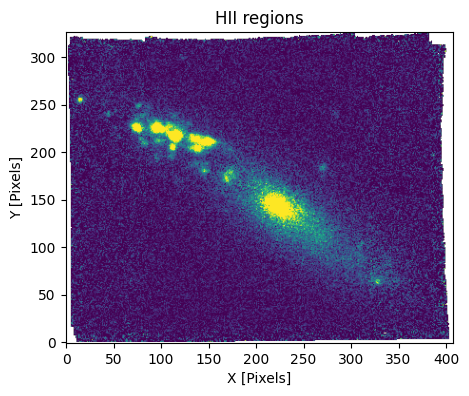

galaxy_HIIregions244.fits


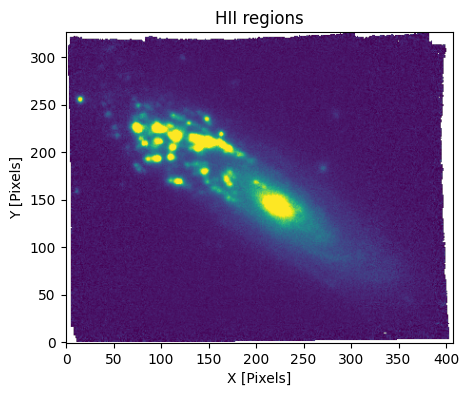

galaxy_HIIregions245.fits


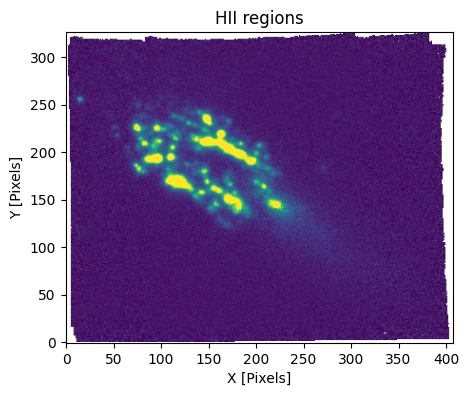

galaxy_HIIregions246.fits


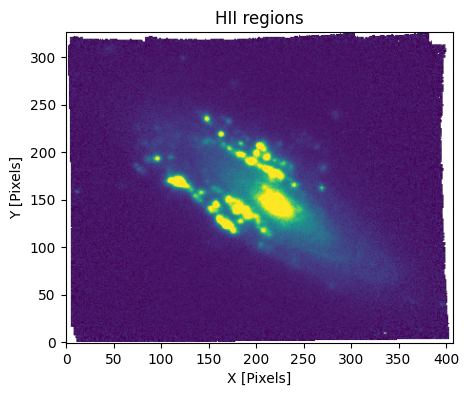

galaxy_HIIregions247.fits


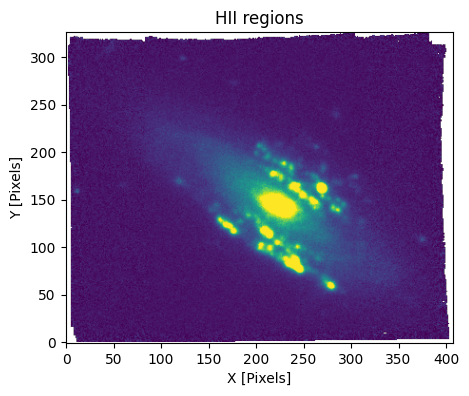

galaxy_HIIregions248.fits


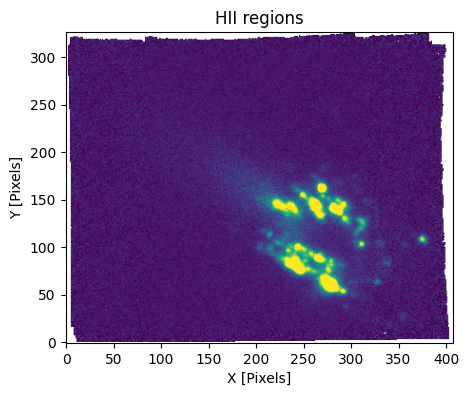

galaxy_HIIregions249.fits


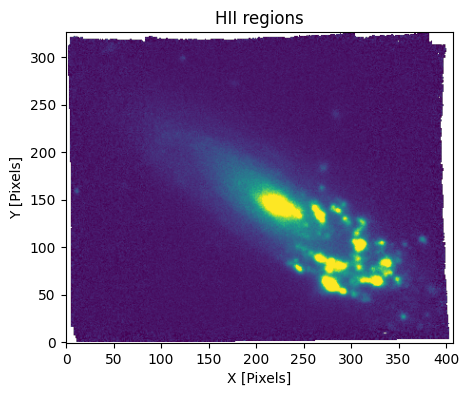

galaxy_HIIregions2410.fits


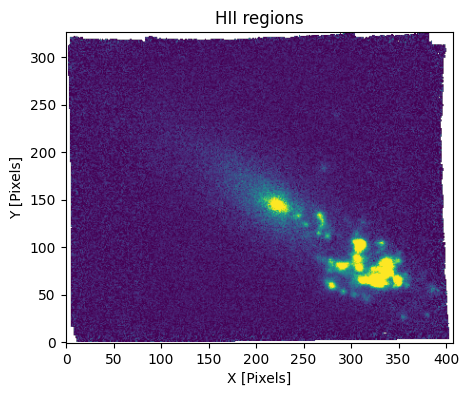

galaxy_HIIregions2411.fits


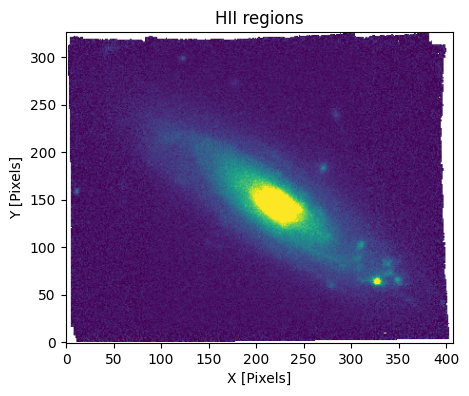

galaxy_HIIregions2412.fits


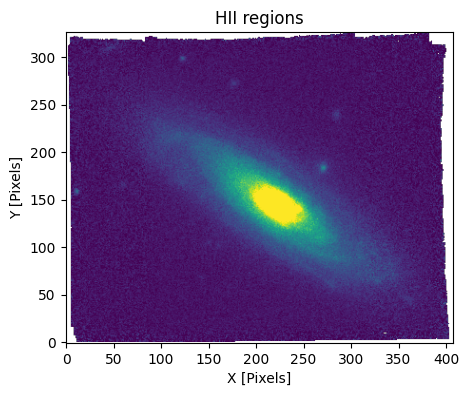

In [46]:
for index_galaxy_concat, filename in zip(galaxy_concat_bands24, fileList_galaxy24):
    print(filename)
    plt.figure("line Ha", figsize=(5,5))
    plt.imshow(
    index_galaxy_concat,  
    vmin=imstats(index_galaxy_concat)['median'] - 0.3 * imstats(index_galaxy_concat)['desviation'], 
    vmax=imstats(index_galaxy_concat)['median'] + 4.0 * imstats(index_galaxy_concat)['desviation'],
    origin="lower")
    plt.title('HII regions')
    plt.xlabel('X [Pixels]')
    plt.ylabel('Y [Pixels]')
    filename_jpg = os.path.splitext(filename)[0]
    plt.savefig(f"{filename_jpg}.jpg")
    plt.show()

In [47]:
fileList_galaxyjpg = natsorted(glob.glob('galaxy_HIIregions24*jpg'))
fileList_galaxyjpg

['galaxy_HIIregions241.jpg',
 'galaxy_HIIregions242.jpg',
 'galaxy_HIIregions243.jpg',
 'galaxy_HIIregions244.jpg',
 'galaxy_HIIregions245.jpg',
 'galaxy_HIIregions246.jpg',
 'galaxy_HIIregions247.jpg',
 'galaxy_HIIregions248.jpg',
 'galaxy_HIIregions249.jpg',
 'galaxy_HIIregions2410.jpg',
 'galaxy_HIIregions2411.jpg',
 'galaxy_HIIregions2412.jpg']

# GIF

![gif](HIIregions.gif)

Finally, we will visualize the HII regions as the redshift increases.

In [48]:
gif_path = "HIIregions.gif"
frames = np.stack([iio.imread(f"{filename}") for filename in fileList_galaxyjpg], axis=0)
imageio.mimsave("HIIregions.gif", frames, duration=8, loop=0)

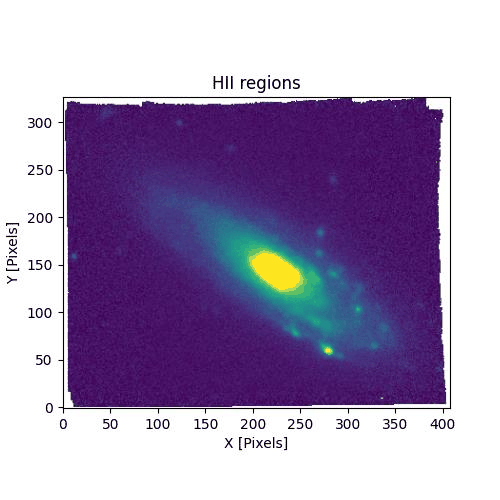

In [49]:
from IPython.display import Image

Image(filename="HIIregions.gif")


# Rotation Curves

To obtain the experimental rotation curves, we will locate some points along the major axis of the galaxy on the H$\alpha$ image. Therefore, we first trace the major axis, and considering that the bright points in the H$\alpha$ image are the ones with this line, we will take these as the largest values of the points array.

To obtain the rotational velocities, we will take the redshift of each point, as this multiplied by the speed of light in a vacuum is equal to the velocity we observe. The observable velocity is related to the rotational velocity through a trigonometric relation: $v_{obs} = v_{rot} cos(\theta) sin(i)$ where $\theta$ and $i$ are the angle with respect to the major axis and the inclination angle, respectively.

Therefore, our goal is also to obtain the spectrum of these points along the major axis to locate an easily visible line and calculate the redshift through the Doppler shift of the spectral lines. However, although we are in an H$\alpha$ image, not all spectra will clearly show this line, as we saw in the previous work. In the nucleus, what is mainly observed are absorption lines, and the NII line will be the one we use in this region.

We obtain the data from the H$\alpha$ image.

In [52]:
galaxy_HIIregion = fits.open('galaxy_Hiiregions.fits')[0].data
galaxy_HIIregion.shape

(327, 408)

We draw the line of the major axis.

In [53]:
# Galaxy center
center_x = 408 / 2
center_y = 327 / 2

In [54]:
x_axis = np.linspace(0, 400, 100)
m_axis = -45 / 56
y_axis = m_axis * (x_axis-(400/2)) + (327/2)

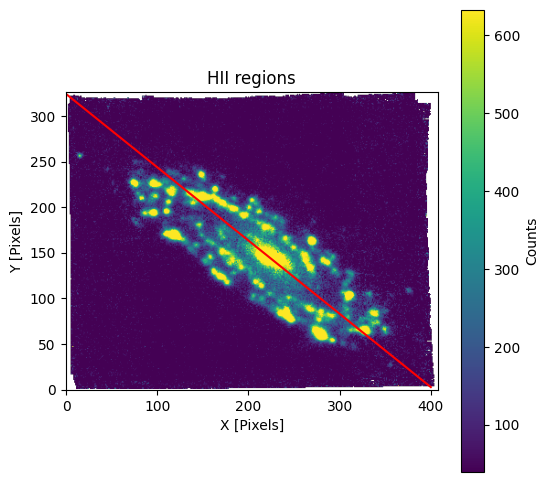

In [65]:
plt.figure("line Ha", figsize=(6,6))
plt.imshow(
    galaxy_HIIregion,  
    vmin=imstats(galaxy_HIIregion)['median'] + 0.1 * imstats(galaxy_HIIregion)['desviation'], 
    vmax=imstats(galaxy_HIIregion)['median'] + 3.0 * imstats(galaxy_HIIregion)['desviation'],
    origin="lower")
plt.colorbar(label="Counts")
plt.title('HII regions')
plt.xlabel('X [Pixels]')
plt.ylabel('Y [Pixels]')
plt.plot(x_axis, y_axis, color='red')
plt.show()

In [60]:
#We save the point that are not nan values
galaxy_points = [
    galaxy_HIIregion[int(index_y), int(index_x)] 
    for index_x, index_y in zip(x_axis, y_axis) 
    if not np.isnan(galaxy_HIIregion[int(index_y), int(index_x)])
]

In [61]:
#Indices of the highest values of the points on the line.
max_index = np.argsort(galaxy_points)[-40:]
max_index

array([37, 67, 42, 64, 43, 47, 46, 31, 36, 72, 29, 44, 73, 45, 62, 74, 77,
       63, 61, 60, 75, 48, 49, 78, 50, 58, 59, 51, 32, 35, 57, 34, 80, 33,
       52, 79, 56, 55, 53, 54])

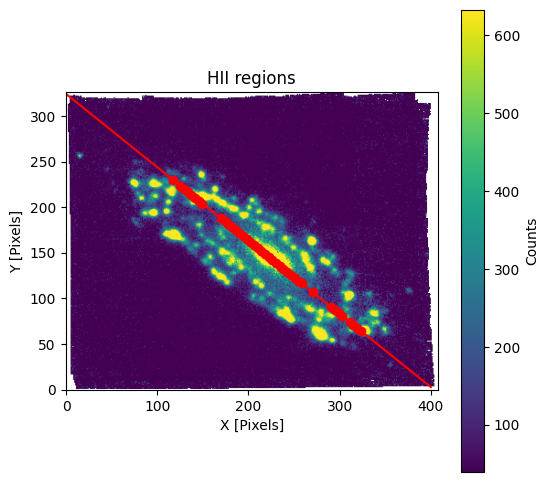

In [66]:
plt.figure("line Ha", figsize=(6,6))
plt.imshow(
    galaxy_HIIregion,  
    vmin=imstats(galaxy_HIIregion)['median'] + 0.1 * imstats(galaxy_HIIregion)['desviation'], 
    vmax=imstats(galaxy_HIIregion)['median'] + 3.0 * imstats(galaxy_HIIregion)['desviation'],
    origin="lower")
plt.colorbar(label="Counts")
plt.plot(x_axis, y_axis, color='red')
plt.title('HII regions')
plt.xlabel('X [Pixels]')
plt.ylabel('Y [Pixels]')
plt.scatter(x_axis[max_index], y_axis[max_index], color='red')
plt.show()

Now we evaluate which of the spectra are useful for locating an easily visible line (H$\alpha$, NII) and thus discard points from the line.

0


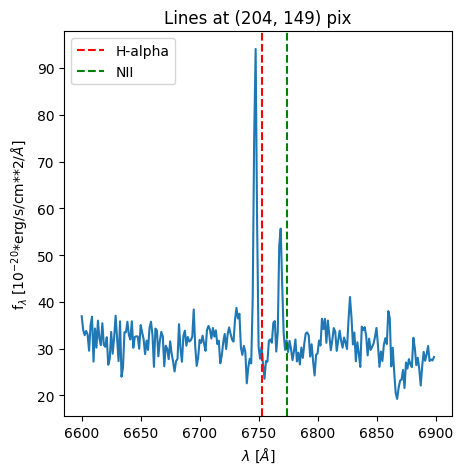

1


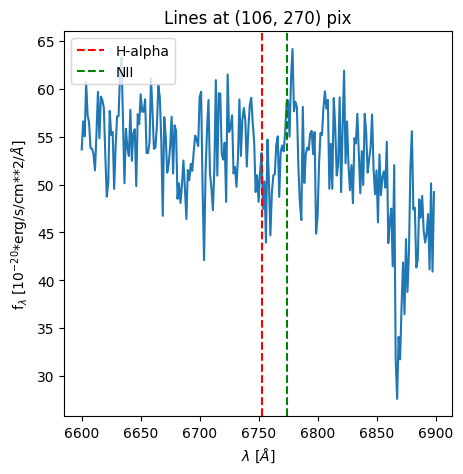

2


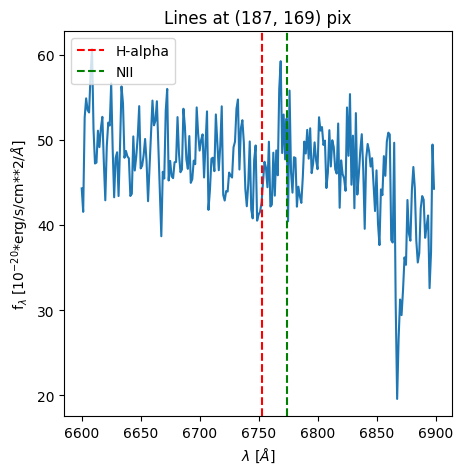

3


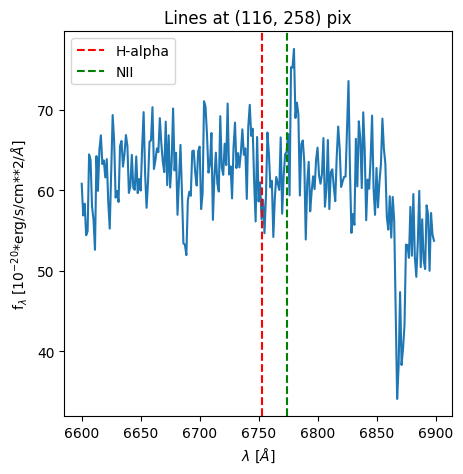

4


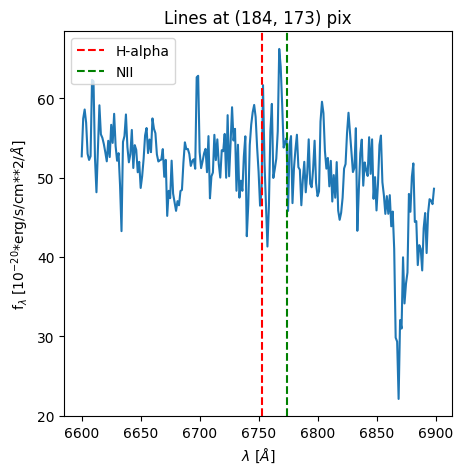

5


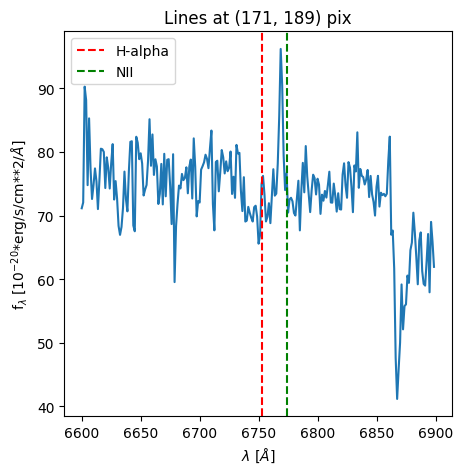

6


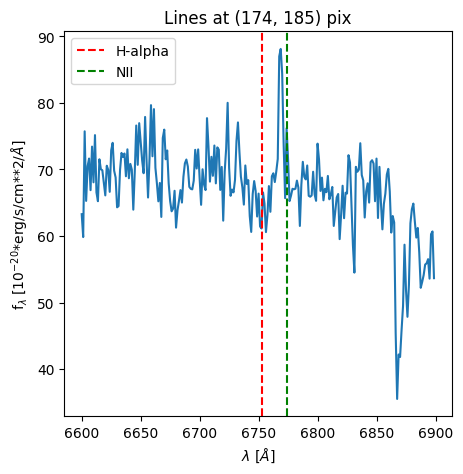

7


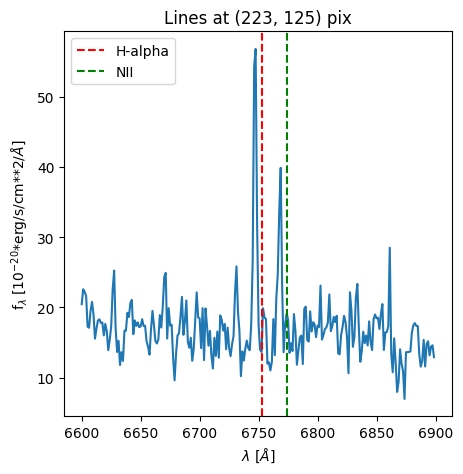

8


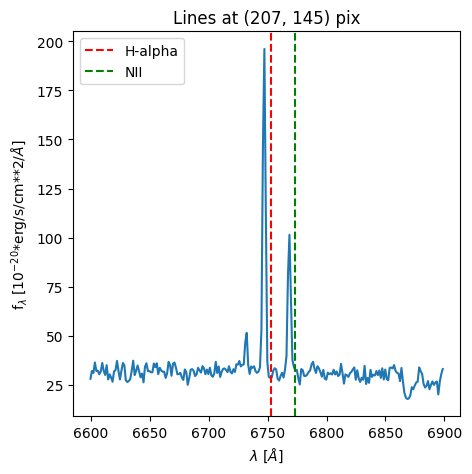

9


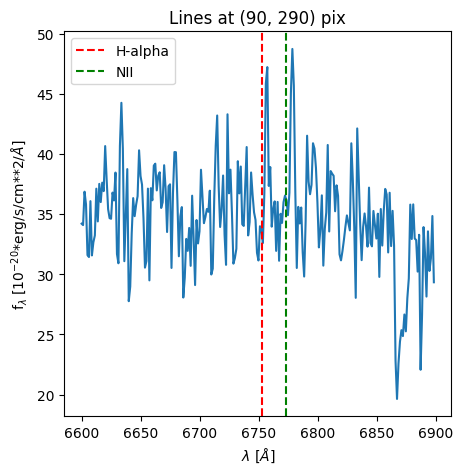

10


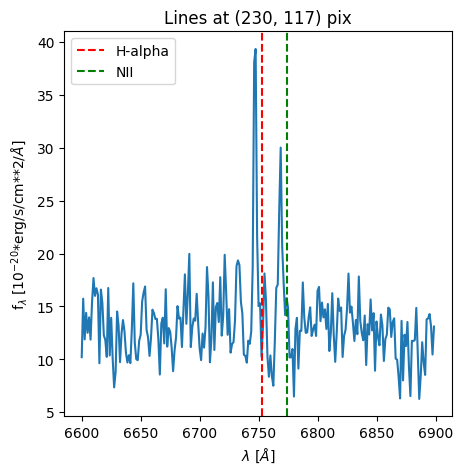

11


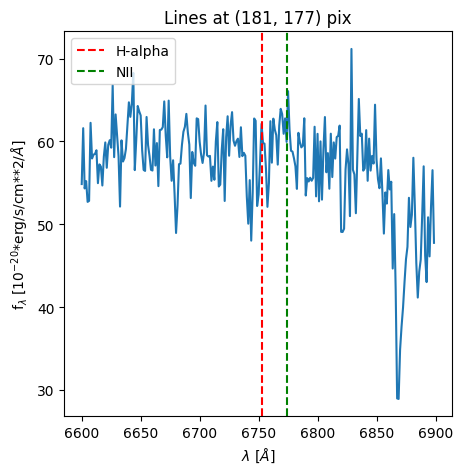

12


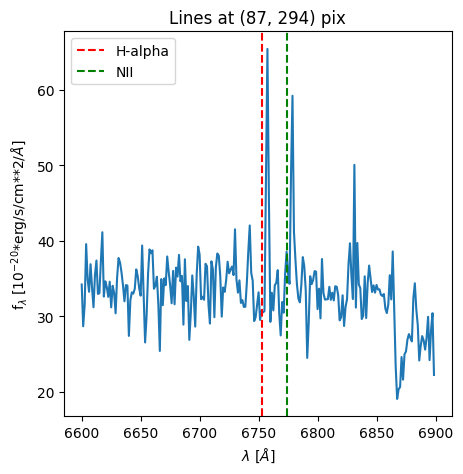

13


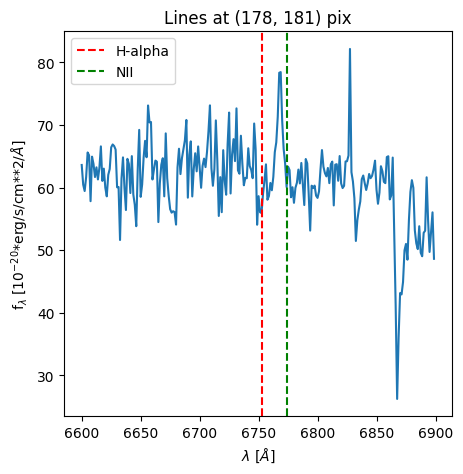

14


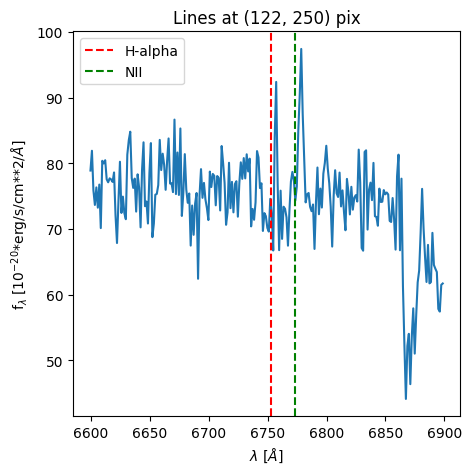

15


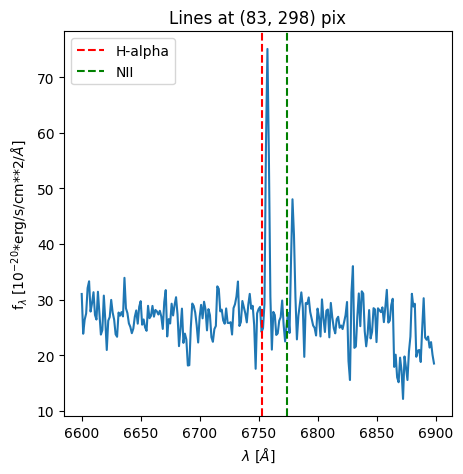

16


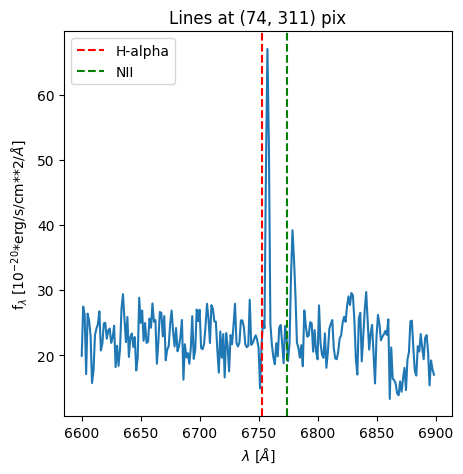

17


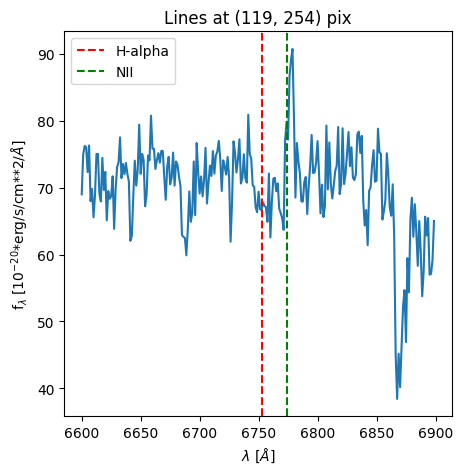

18


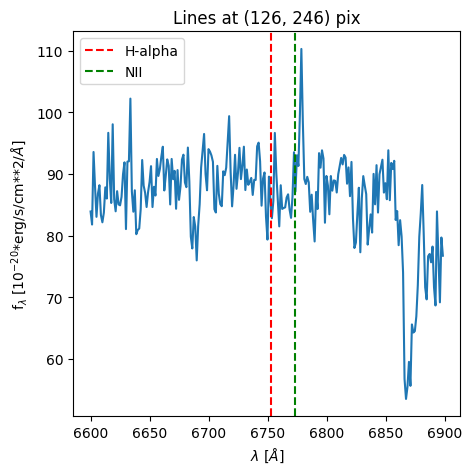

19


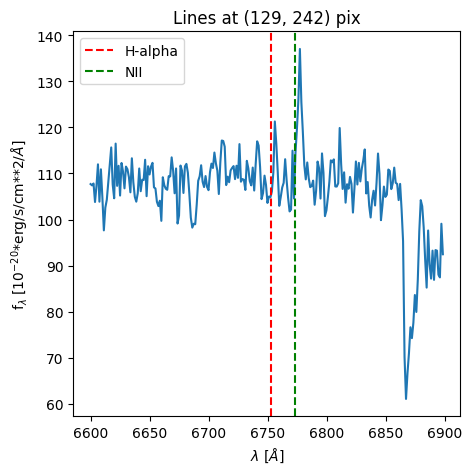

20


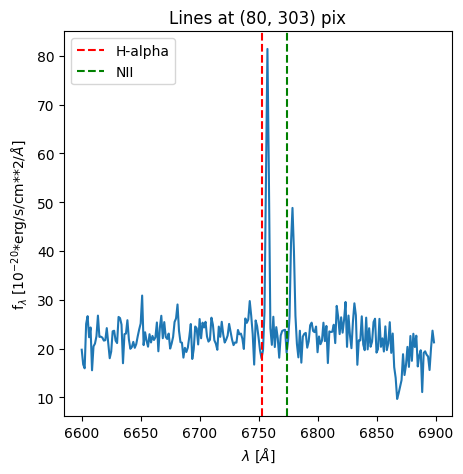

21


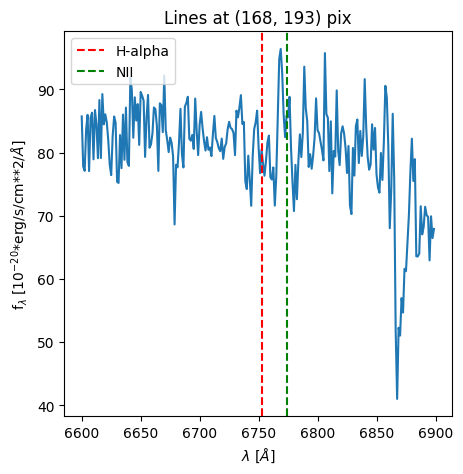

22


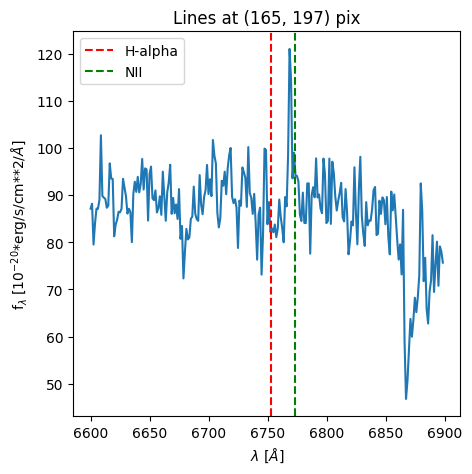

23


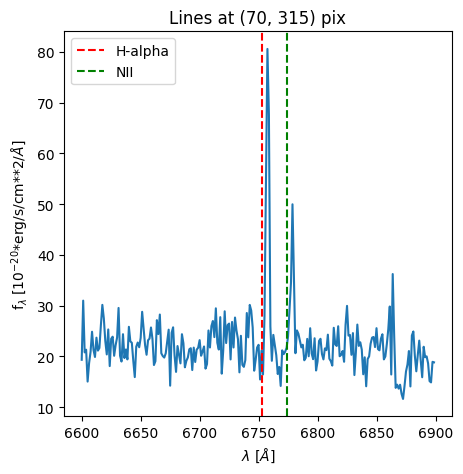

24


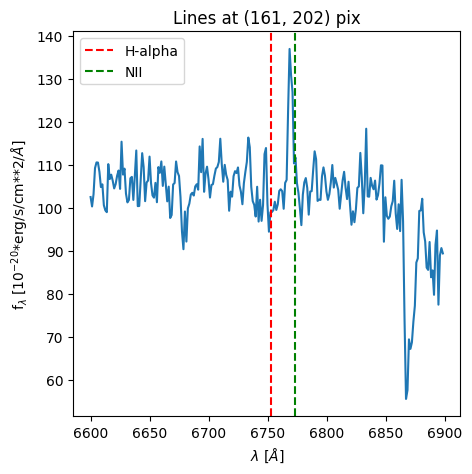

25


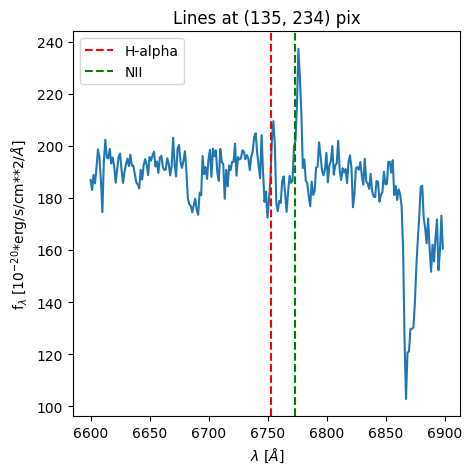

26


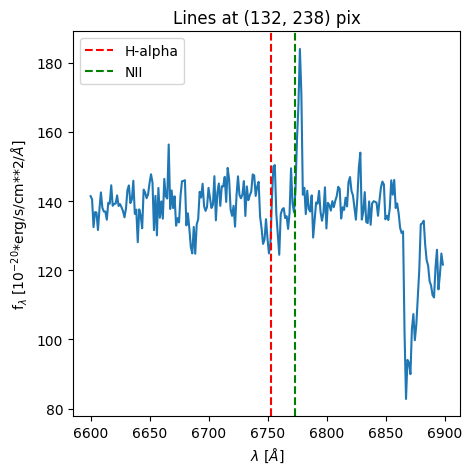

27


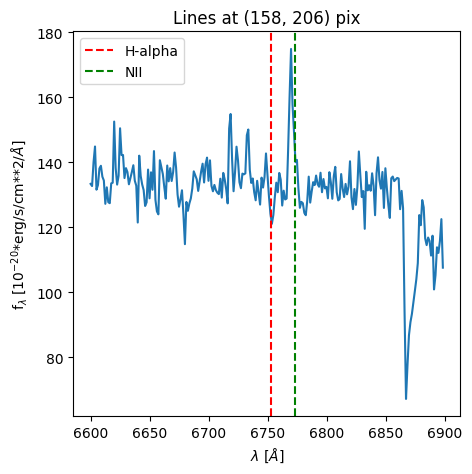

28


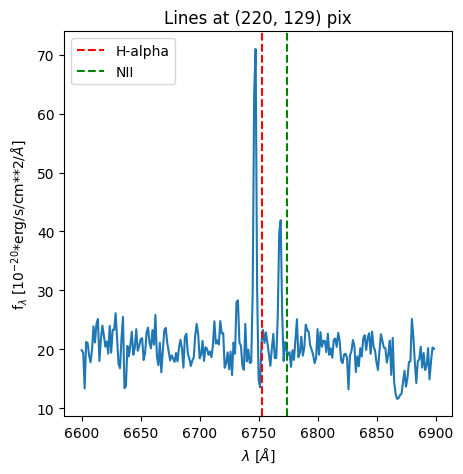

29


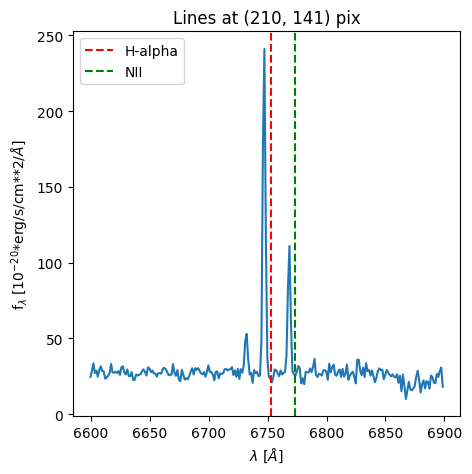

30


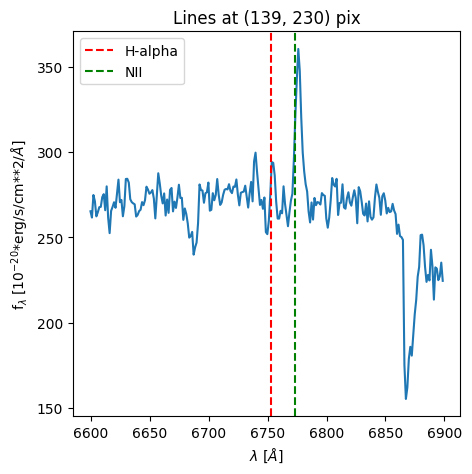

31


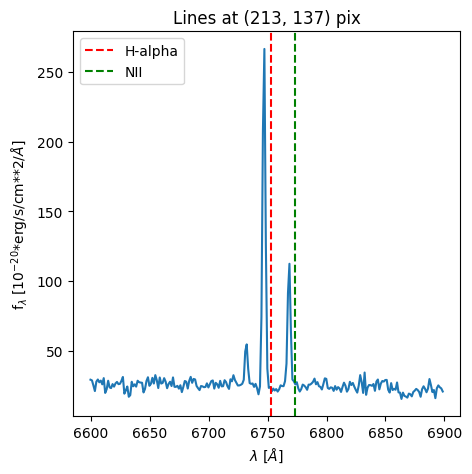

32


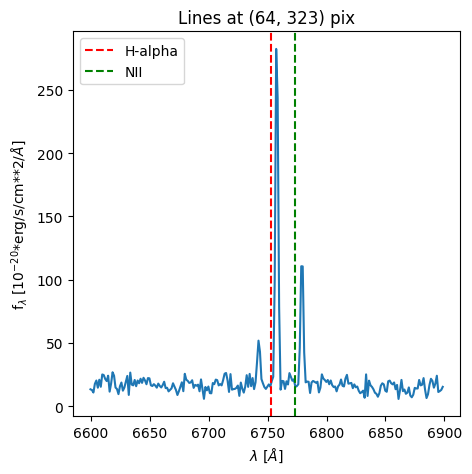

33


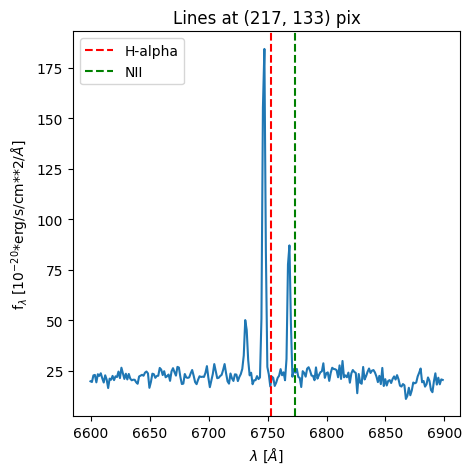

34


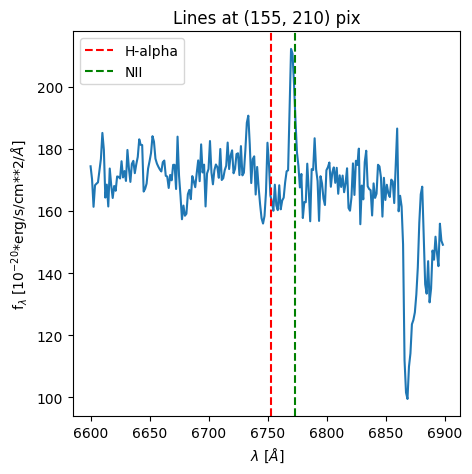

35


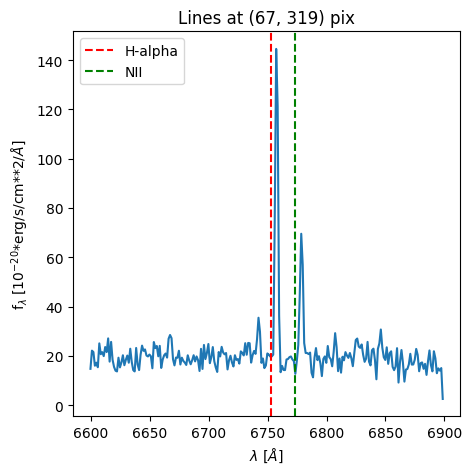

36


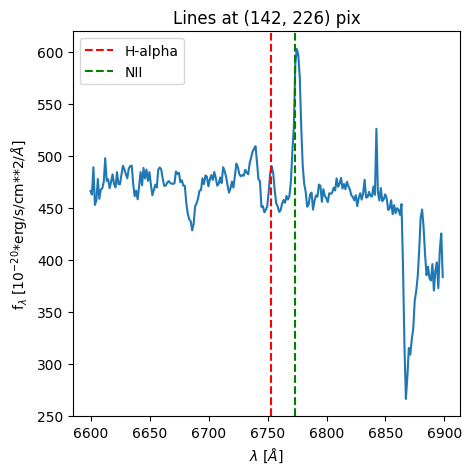

37


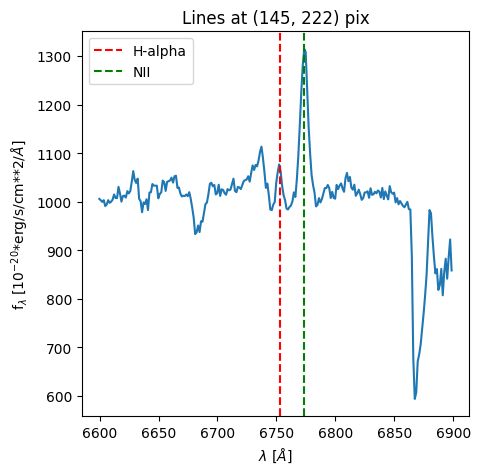

38


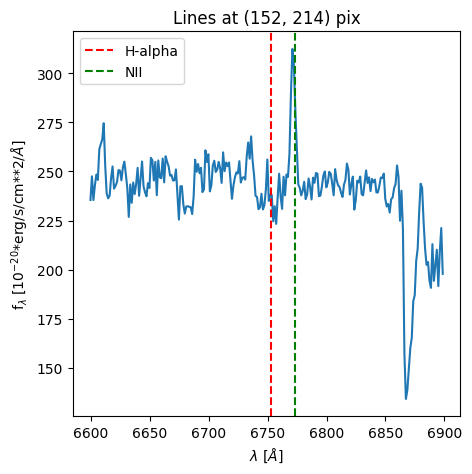

39


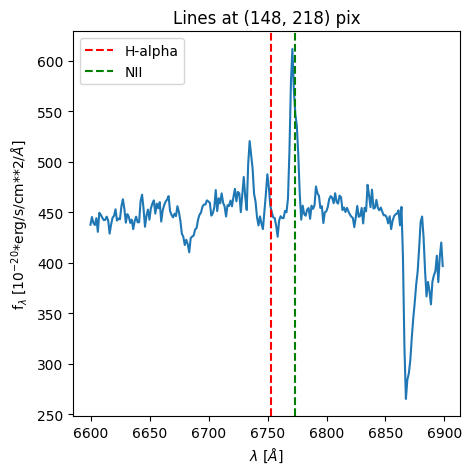

In [67]:
j=0
pixel_1 = int((6600 - CRVAL3) / lambda_scale + CRPIX3)
pixel_2 = int((6900 - CRVAL3) / lambda_scale + CRPIX3)
Lambda_2 = Lambda[pixel_1:pixel_2]
for i in max_index:
    print(j)
    region = data[pixel_1:pixel_2, int(y_axis[i]), int(x_axis[i])]
    plt.figure('Spectrums', figsize=(5,5))
    plt.plot(Lambda_2, region)
    plt.title(f"Lines at {int(y_axis[i]), int(x_axis[i])} pix")
    plt.xlabel('$\lambda$ [$\AA$]')
    plt.ylabel('f$_{\lambda}$ [$10^{-20}$*erg/s/cm**2/$\AA$]')
    plt.axvline(x=Lambda_obs, color='r', linestyle='--', label='H-alpha')  # Línea vertical roja en x=1
    plt.axvline(x=Lambda_obs_NII, color='g', linestyle='--', label='NII')  # Línea vertical roja en x=1
    plt.legend(loc=2)
    plt.show()
    j=j+1

In [69]:
#We remove bad spectrums
index_rm_Ha = [
    1, 2, 3, 4, 5, 6, 9, 11, 13, 14, 17, 18, 19, 
    21, 22, 24, 25, 26, 27, 30, 34, 36, 37, 38, 39
              ]
index_rm_NII = [
    0, 1, 2, 3, 4, 7, 8, 9, 10, 11, 12, 15, 
    16, 20, 21, 23, 28, 29, 31, 32, 33, 35
]
index_rm = np.intersect1d(index_rm_Ha, index_rm_NII)
max_index_rm_Ha = np.delete(max_index, index_rm_Ha)
max_index_rm_NII = np.delete(max_index, index_rm_NII)
max_index_rm =  np.delete(max_index, index_rm)

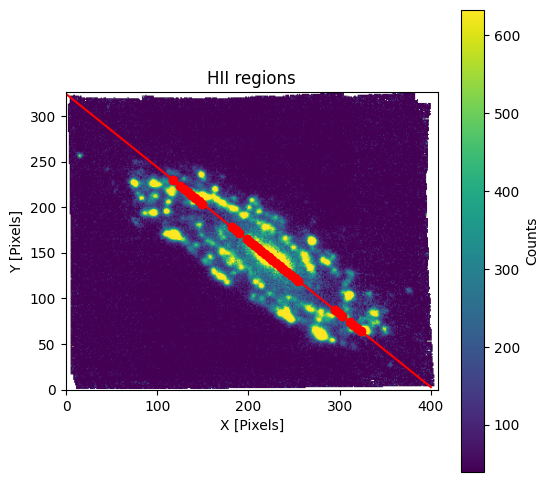

In [70]:
plt.figure("line Ha", figsize=(6,6))
plt.imshow(
    galaxy_HIIregion,  
    vmin=imstats(galaxy_HIIregion)['median'] + 0.1 * imstats(galaxy_HIIregion)['desviation'], 
    vmax=imstats(galaxy_HIIregion)['median'] + 3.0 * imstats(galaxy_HIIregion)['desviation'],
    origin="lower")
plt.colorbar(label="Counts")
plt.plot(x_axis, y_axis, color='red')
plt.title('HII regions')
plt.xlabel('X [Pixels]')
plt.ylabel('Y [Pixels]')
plt.scatter(x_axis[max_index_rm], y_axis[max_index_rm], color='red')
plt.show()

## H$\alpha$ Spetrum

https://docs.astropy.org/en/stable/modeling/fitting.html#simple-1-d-model-fitting

We begin by calculating the redshifts for the H$\alpha$ lines. To do this, we perform a Gaussian fit to locate the line and obtain its wavelength.

In [72]:
pixel1 = int((6600 - CRVAL3) / lambda_scale + CRPIX3)
pixel2 = int((6800 - CRVAL3) / lambda_scale + CRPIX3)

In [73]:
center_arcsec_x = pixelscale_x * (center_x - CRPIX1) + CRVAL1
center_arcsec_y = pixelscale_y * (center_y - CRPIX2) + CRVAL2

In [74]:
mean_points_Ha = np.zeros(len(max_index_rm_Ha))
amplitude_points_Ha = np.zeros_like(mean_points_Ha)
dist_points_pc_Ha = np.zeros_like(mean_points_Ha)

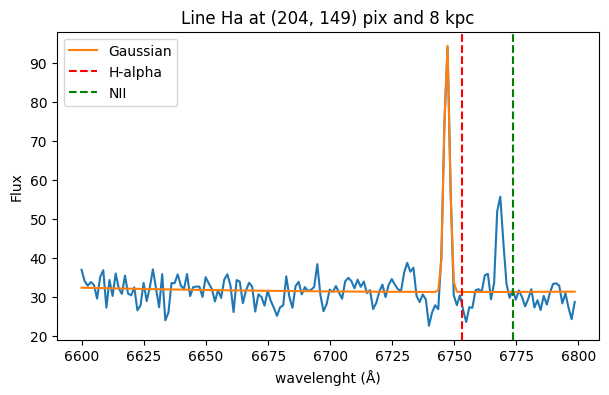

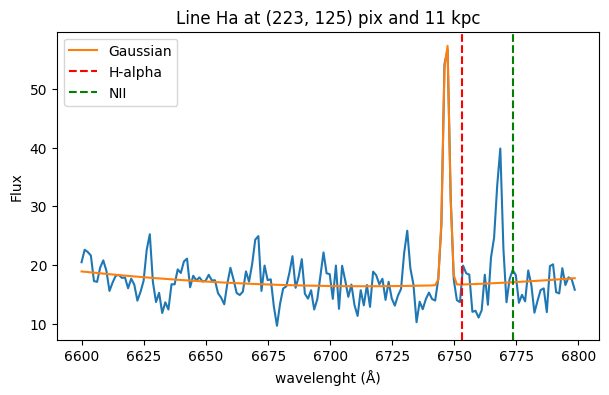

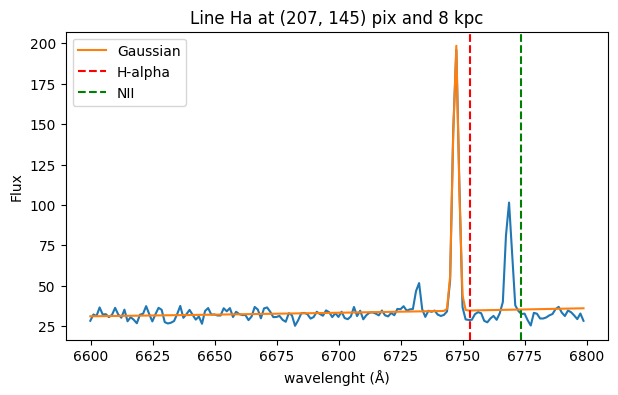

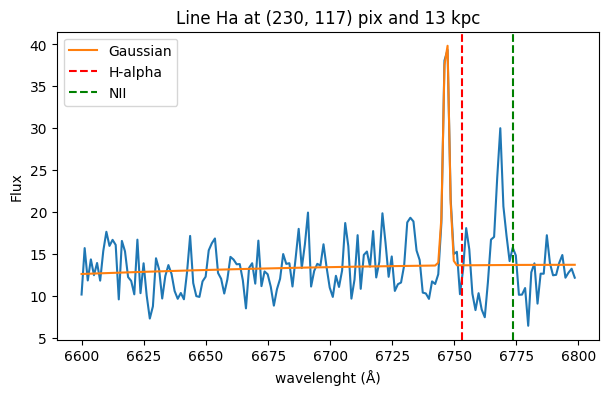

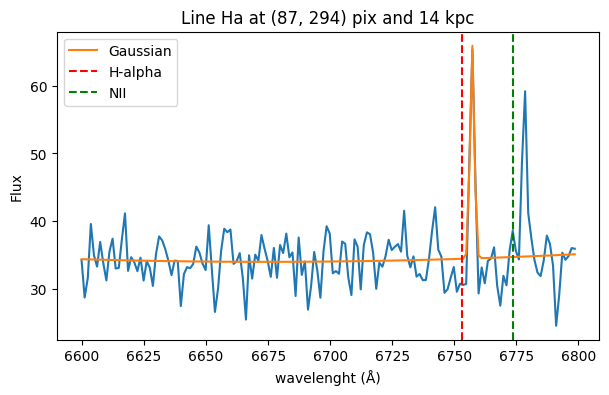

...

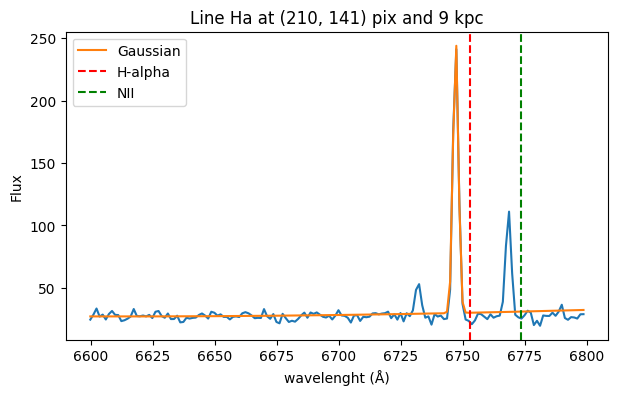

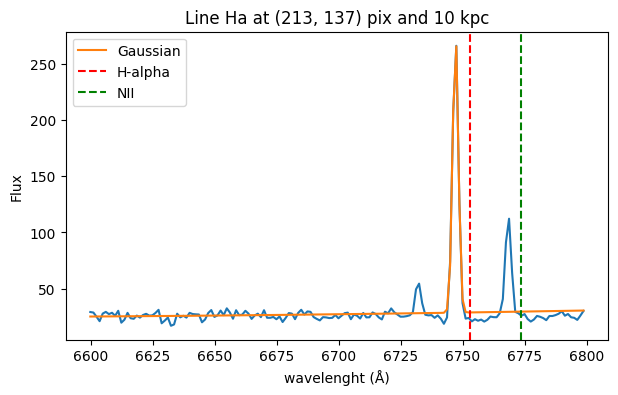

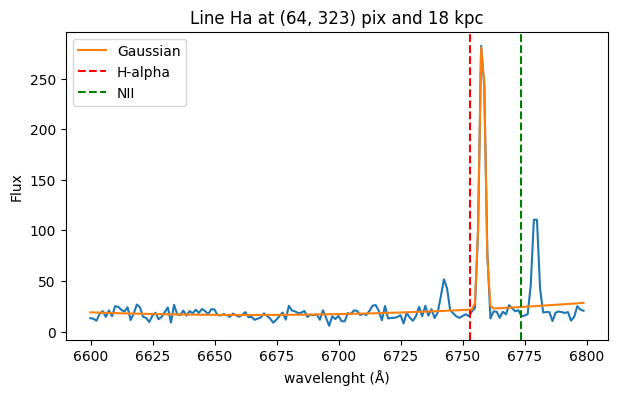

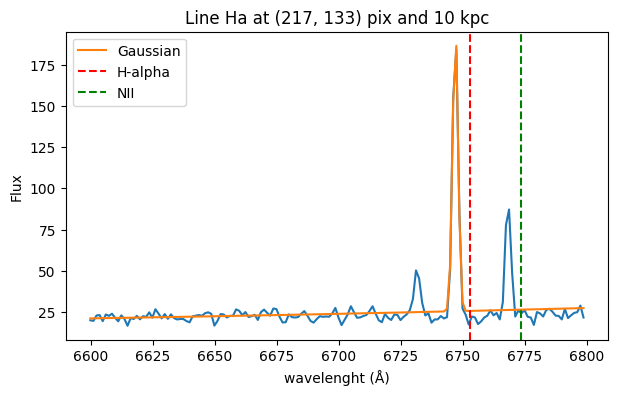

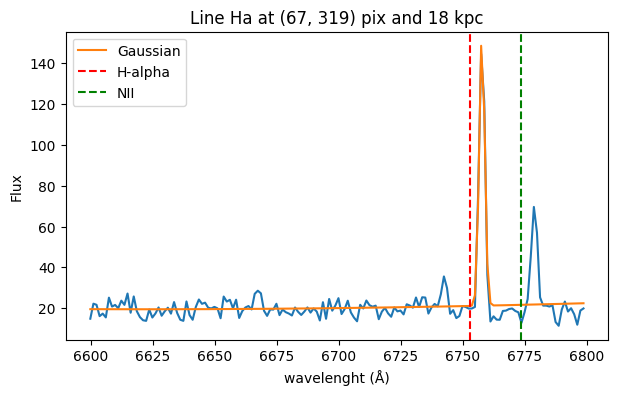

In [171]:
for j, i in enumerate(max_index_rm_Ha):
    spectrum = data[pixel1:pixel2, int(y_axis[i]), int(x_axis[i])]
    Lambda2 = Lambda[pixel1:pixel2]
    index_mean = np.argmax(spectrum)
    mean_value = Lambda2[index_mean] 
    amplitude_value = spectrum[index_mean]

    # Fit the data using a Gaussian
    g_init = models.Gaussian1D(amplitude=amplitude_value, mean=mean_value, stddev=2.)
    fit_g = fitting.TRFLSQFitter()

    grado = 2  
    polinomio = Polynomial1D(degree=grado)
    g_init = g_init + polinomio
    g = fit_g(g_init, Lambda2, spectrum)
    
    mean_points_Ha[j] = g.mean_0.value
    amplitude_points_Ha[j] = g.amplitude_0.value
    dist_points_pc_Ha[j] = np.sqrt((center_x-int(x_axis[i]))**2 + (center_y-int(y_axis[i]))**2) * pix_pc * 10**-3
    
    # Plot the data with the best-fit model
    plt.figure(figsize=(7,4))
    plt.title(f"Line Ha at {int(y_axis[i]), int(x_axis[i])} pix and {int(dist_points_pc_Ha[j])} kpc")
    plt.plot(Lambda2, spectrum, '-')
    plt.plot(Lambda2, g(Lambda2), label='Gaussian')
    plt.axvline(x=Lambda_obs, color='r', linestyle='--', label='H-alpha')  
    plt.axvline(x=Lambda_obs_NII, color='g', linestyle='--', label='NII')  
    plt.ylabel('Flux')
    plt.xlabel('wavelenght (Å)')
    plt.legend(loc=2)


## NII Spectrum

https://docs.astropy.org/en/stable/modeling/fitting.html#simple-1-d-model-fitting

We do the same for the NII lines.

In [116]:
mean_points_NII = np.zeros(len(max_index_rm_NII))
amplitude_points_NII = np.zeros_like(mean_points_NII)
dist_points_pc_NII = np.zeros_like(mean_points_NII)

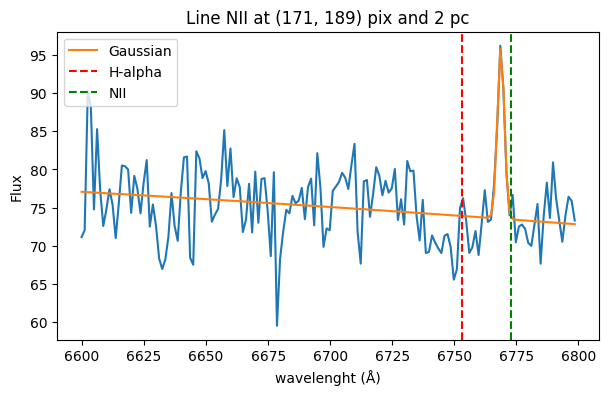

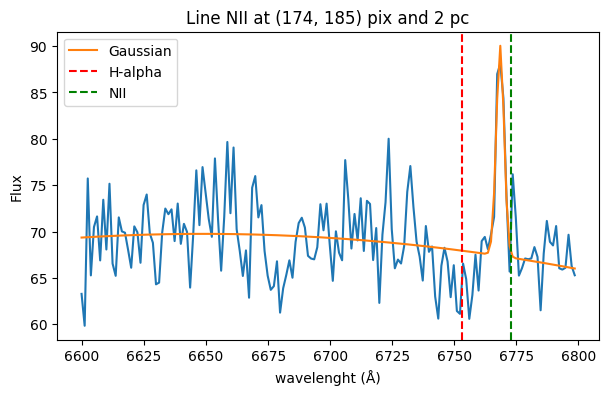

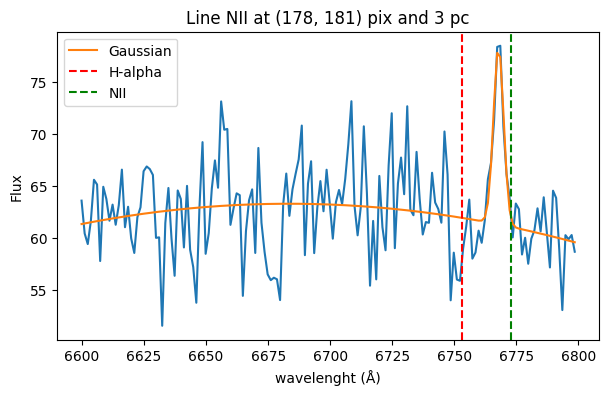

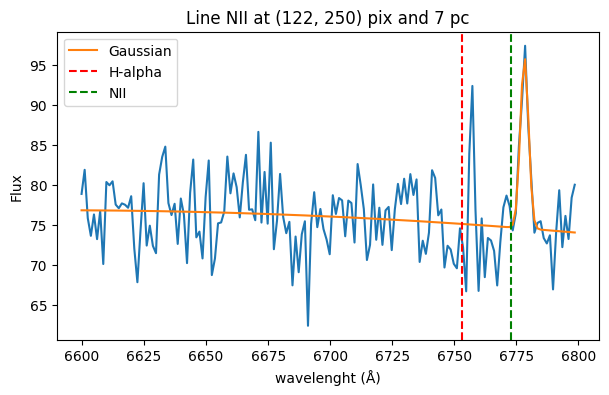

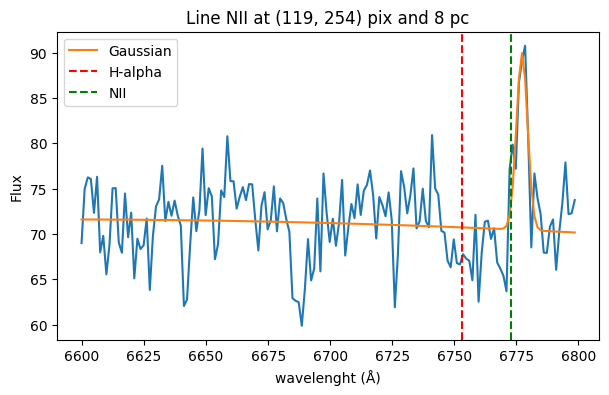

...

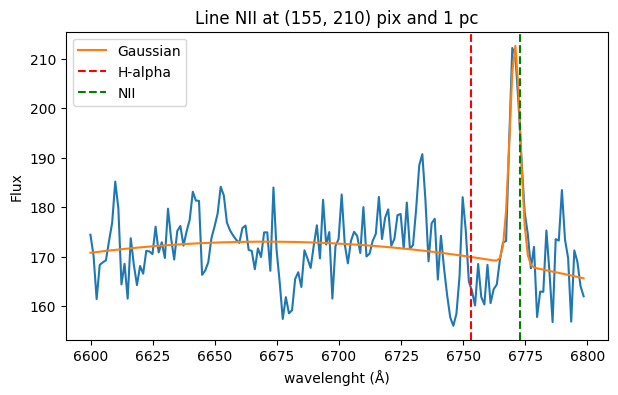

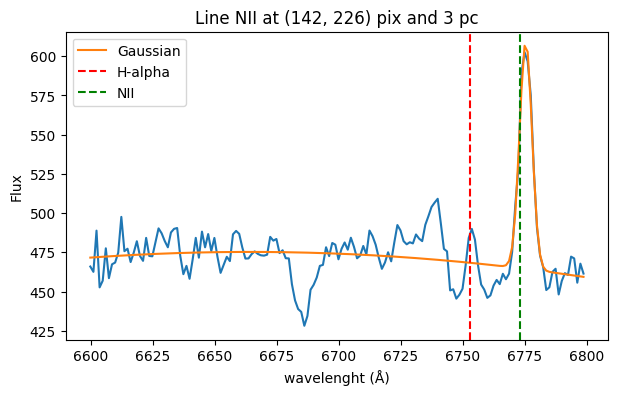

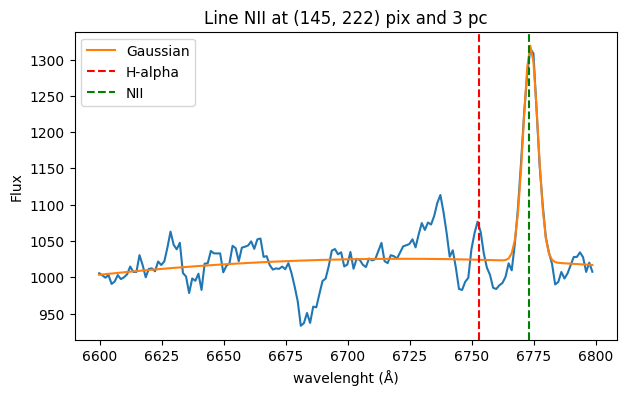

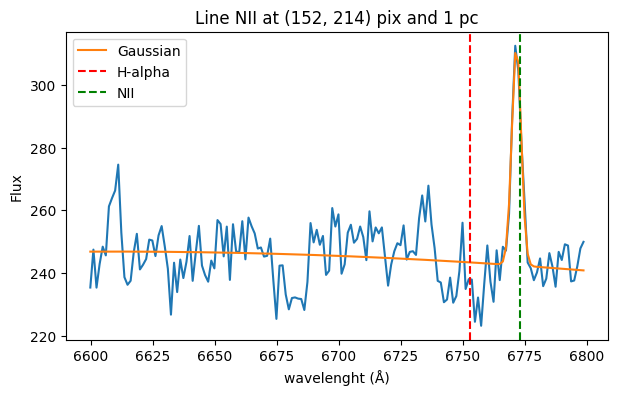

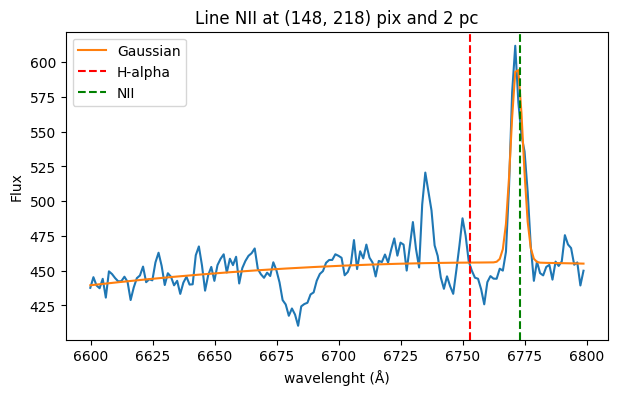

In [117]:
for j, i in enumerate(max_index_rm_NII):
    spectrum = data[pixel1:pixel2, int(y_axis[i]), int(x_axis[i])]
    Lambda2 = Lambda[pixel1:pixel2]
    index_mean = np.argmax(spectrum)
    mean_value = Lambda2[index_mean] 
    amplitude_value = spectrum[index_mean]

    # Fit the data using a Gaussian
    g_init = models.Gaussian1D(amplitude=amplitude_value, mean=mean_value, stddev=2.)
    fit_g = fitting.TRFLSQFitter()

    grado = 2  
    polinomio = Polynomial1D(degree=grado)
    g_init = g_init + polinomio
    g = fit_g(g_init, Lambda2, spectrum)
    
    mean_points_NII[j] = g.mean_0.value
    amplitude_points_NII[j] = g.amplitude_0.value
    dist_points_pc_NII[j] = np.sqrt((center_x-int(x_axis[i]))**2 + (center_y-int(y_axis[i]))**2) * pix_pc * 10**-3
        
    # Plot the data with the best-fit model
    plt.figure(figsize=(7,4))
    plt.title(f"Line NII at {int(y_axis[i]), int(x_axis[i])} pix and {int(dist_points_pc_NII[j])} kpc")
    plt.plot(Lambda2, spectrum, '-')
    plt.plot(Lambda2, g(Lambda2), label='Gaussian')
    plt.axvline(x=6753, color='r', linestyle='--', label='H-alpha')  
    plt.axvline(x=6773, color='g', linestyle='--', label='NII')  
    plt.ylabel('Flux')
    plt.xlabel('wavelenght (Å)')
    plt.legend(loc=2)

## Experimental rotation curve

We are now in a position to calculate the rotational velocities for each point. First, we will calculate the redshift, keeping in mind that since we want to calculate the velocity of rotation around the nucleus, we must obtain the redshift relative to the center.

In [144]:
redshift_pointHa = [(lambdaHa_index - Lambda_Ha) / Lambda_Ha for lambdaHa_index in mean_points_Ha]
redshift_pointNII = [(lambdaNII_index - Lambda_NII) / Lambda_NII for lambdaNII_index in mean_points_NII]
redshift_point = np.concatenate((redshift_pointHa, redshift_pointNII))
redshift_rel = [abs(redshift - redshift_point_index) for redshift_point_index in redshift_point]

0.028947371544128853

In [174]:
dist_points_pc = np.concatenate((dist_points_pc_Ha, dist_points_pc_NII))

In [172]:
v_obs = [index_redshift_rel * c for index_redshift_rel in redshift_rel]
v_rot = v_obs / (np.cos(theta) * np.sin(incl))

In [173]:
print(f"{'Redshift relativo':<20}{'Redshift':<15}{'V_obs (km/s)':<15}{'Dist (kpc)':<15}")
print('-' * 65)
for i in np.argsort(redshift_rel):
    print(f"{redshift_rel[i]:<20.5f}{redshift_point[i]:<15.5f}{v_obs[i]:<15.2f}{dist_points_pc[i]:<15.2f}")

Redshift relativo   Redshift       V_obs (km/s)   Dist (kpc)     
-----------------------------------------------------------------
0.00001             0.02896        4.34           3.10           
0.00027             0.02921        79.63          3.70           
0.00028             0.02867        83.44          2.51           
0.00030             0.02864        91.04          1.83           
0.00040             0.02935        120.29         4.30           
0.00040             0.02854        120.74         1.25           
0.00043             0.02938        128.69         4.98           
0.00055             0.02949        163.87         5.58           
0.00055             0.02840        164.26         0.70           
0.00056             0.02951        168.12         6.17           
0.00057             0.02952        170.79         8.05           
0.00064             0.02830        193.25         0.39           
0.00065             0.02959        194.12         14.21          
0.00065   

Although the values in the table seem to make sense, when plotting the points they appear very scattered, and the curve does not show the expected shape at all. Therefore, it should not be taken into account when evaluating the experimental rotational velocity. The errors may be due to the sensitivity involved in determining the wavelengths in the spectra; a small error in that step can lead to a considerable difference in the velocities, since, as can be seen, the difference between the redshifts is very small (on the order of $10^{−4}$).

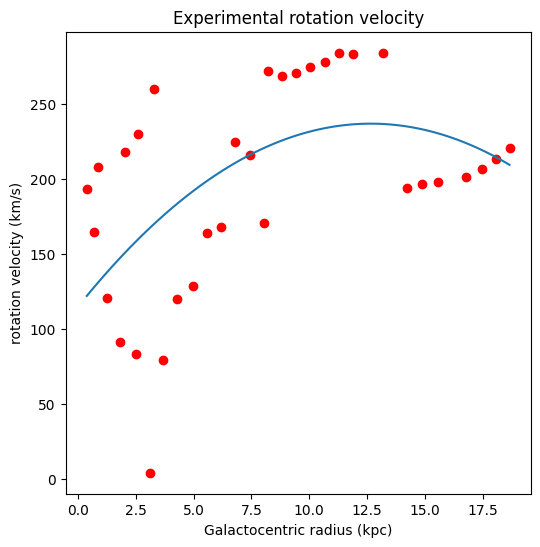

In [168]:
plt.figure("Rotation velocity", figsize=(6,6))
plt.scatter(dist_points_pc, v_obs, color='red')
degree = 2
coefficients_exp = np.polyfit(dist_points_pc, v_obs, degree)
poly_exp = np.poly1d(coefficients_exp)
poly_exp_x = np.linspace(min(dist_points_pc), max(dist_points_pc), 100)
poly_exp_y = poly_exp(poly_exp_x)
plt.xlabel('Galactocentric radius (kpc)')
plt.ylabel('rotation velocity (km/s)')
plt.title('Experimental rotation velocity')
plt.plot(poly_exp_x, poly_exp_y)
plt.show()

## Mass profile

Using experimental data on the visible mass contained within a sphere of radius distdist, we will calculate the theoretical rotation curve given by Newton's gravitational force equation. We will base our calculations on the result from Newtonian gravitational theory, which states that when we have a system symmetrically distributed around a central point, the gravitational force experienced by a body at a radius r is due only to the mass contained within the sphere of that radius (Jones & Lambourne, 2003).

In [87]:
#we extract data
dist, mass = np.loadtxt('perfil_masa.txt', unpack=True)

In [124]:
G = 6.67430e-20                   #km³/kg/s²
dist_pc = (dist / (3.0857 * 1e13)) * 10**-3

In [125]:
v_rot_mass = np.sqrt(G * mass / dist)

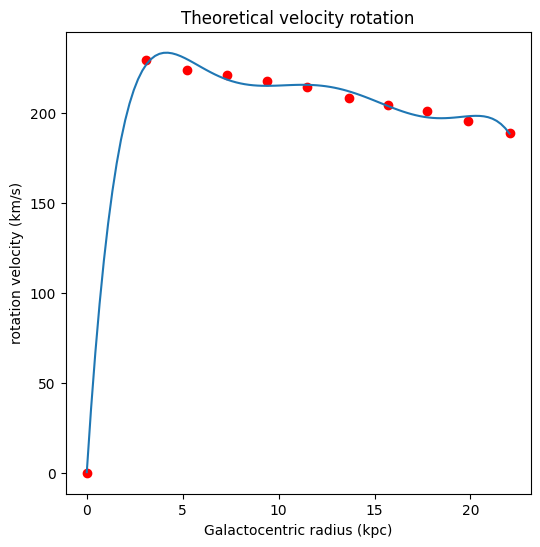

In [169]:
plt.figure("perfil de masa", figsize=(6,6))
plt.scatter(dist_pc, v_rot_mass, color='red')
degree = 6
coefficients_mass = np.polyfit(dist_pc, v_rot_mass, degree)
poly_mass = np.poly1d(coefficients_mass)
poly_mass_x = np.linspace(min(dist_pc), max(dist_pc), 100)
poly_mass_y = poly_mass(poly_mass_x)
plt.xlabel('Galactocentric radius (kpc)')
plt.ylabel('rotation velocity (km/s)')
plt.title('Theoretical velocity rotation')
plt.plot(poly_mass_x, poly_mass_y)
plt.show()

## Comparison

We compare the experimental and theoretical rotation curves. The theoretical curve eventually decreases with distance, while the experimental one (if everything had gone correctly) would show a constant velocity once reaching the disk. This is due to the presence of dark matter, especially located in the outer regions, which gives the galaxy a greater mass than what is visible. Thus, by applying Newtonian gravity while taking dark matter into account, we would obtain a constant velocity.

Although the experimental curve did not turn out well, we still include it in the plot in order to complete the exercise.

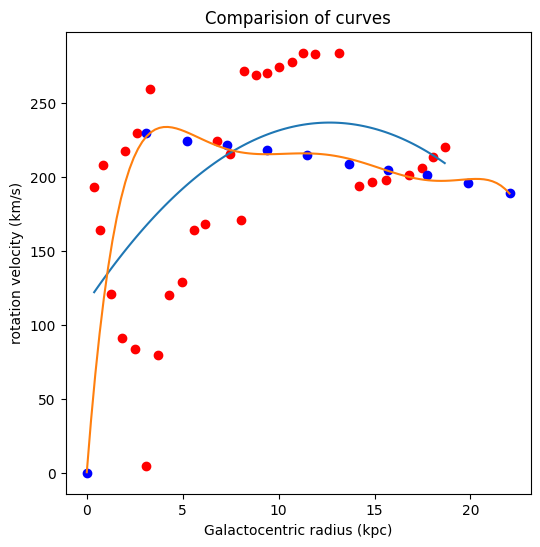

In [170]:
plt.figure("Rotation velocity", figsize=(6,6))
plt.scatter(dist_points_pc, v_obs, color='red')
plt.scatter(dist_pc, v_rot_mass, color='blue')
plt.xlabel('Galactocentric radius (kpc)')
plt.ylabel('rotation velocity (km/s)')
plt.plot(poly_exp_x, poly_exp_y)
plt.plot(poly_mass_x, poly_mass_y)
plt.title('Comparision of curves')
plt.show()

# Conclusion

In this work, we successfully identified the HII regions based on redshift using different integration intervals, thus observing the effect of rotation and visualizing it with a GIF. For the rotation curves, which were the primary objective, we identified the wavelengths of the H$\alpha$ and NII lines in different spectra from points distributed along the galaxy's major axis, using Gaussian fitting. These lines allow us to calculate the redshift at those points, and consequently, the rotational velocity.

Although the redshift results appeared to be correct, the plot of the experimental rotation curve does not match reality. This may be due to errors in performing the Gaussian fits, as the rotational velocities are highly sensitive to the redshift values.